# Implementing and training the Detection Transformer (DETR) models

In [1]:
import os
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"

In [2]:
import torch
from torch import nn
from torch.utils.data import DataLoader
from torchvision import ops


# Import the custom COCO dataset loader
from dataloaders.coco_od_pytorch import TorchCOCOLoader, collate_fn
from models.detr import DETR
from models.cond_detr import ConditionalDETR

c:\Users\mrinmoy\anaconda3\Lib\site-packages\albumentations\__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.8' (you have '2.0.4'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


## Set the experiment configurations

In [3]:
# Batch size for dataloaders and image size for model/pre-processing
BATCH_SIZE = 4
IMAGE_SIZE = 480
MAX_OBJECTS = 100
FREEZE_BACKBONE = True
EPOCHS = 150
LOG_FREQUENCY = 5 # Training-time losses will be logged according to this frequency
SAVE_FREQUENCY = 20 # Model weights will be saved according to this frequency
device = torch.device("cuda" if torch.cuda.is_available() else "cpu") # Training device

## Create a PyTorch Dataloader

In [4]:
# NOTE: You can load the COCO dataset infromation or any other from the available datasets 
#       if it's in the DATASET_CLASSES class map. This map is a lookup dictionary with the
#       dataset name as key where each instance has the following attributes:
#           - "class_names" : The list of class names
#           - "empty_class_id": The ID of the class to be treated as the "empty" class for boxes
#           - "links": Contains some sort of link to download the dataset
# NOTE: All the available datasets are listed in the project README file.
from datasets.info import DATASET_CLASSES
#CLASSES = DATASET_CLASSES["people_hq"]["class_names"]
#EMPTY_CLASS_ID = DATASET_CLASSES["people_hq"]["empty_class_id"]


# Or explicitly set the  class labels/empty class ID for your custom dataset if its not added to the DATASET_CLASSES map...
CLASSES = ["N/A", "person"]
EMPTY_CLASS_ID = 0 # ID of the dataset classes to treat as "empty" class


# Load and COCO dataset (adjust the paths accordingly)
coco_ds_train = TorchCOCOLoader(
    'C:\\Users\\mrinmoy\\Desktop\\dino_reid_project\\CrowdHuman.v3-blurhumanfinal.coco\\train',
    'C:\\Users\\mrinmoy\\Desktop\\dino_reid_project\\CrowdHuman.v3-blurhumanfinal.coco\\train\\_annotations.coco.json',
    max_boxes=MAX_OBJECTS,
    empty_class_id=EMPTY_CLASS_ID,
    image_size=IMAGE_SIZE,
    augment=True
)

coco_ds_val = TorchCOCOLoader(
    'C:\\Users\\mrinmoy\\Desktop\\dino_reid_project\\CrowdHuman.v3-blurhumanfinal.coco\\valid',
    'C:\\Users\\mrinmoy\\Desktop\\dino_reid_project\\CrowdHuman.v3-blurhumanfinal.coco\\valid\\_annotations.coco.json',
    max_boxes=MAX_OBJECTS,
    empty_class_id=EMPTY_CLASS_ID,
    image_size=IMAGE_SIZE,
)
from torch.utils.data import DataLoader, Subset
import numpy as np
percentage = 0.1
num_train = len(coco_ds_train)
subsetsize = int(num_train * percentage)

# Generate indices and convert to Python ints
subsetindics = np.random.choice(num_train, subsetsize, replace=False)
subsetindics = [int(i) for i in subsetindics]  # ✅ list of Python ints
training_subset=torch.utils.data.Subset(coco_ds_train,subsetindics)

train_loader = DataLoader(
    training_subset, batch_size=BATCH_SIZE, shuffle=True, collate_fn=collate_fn)

val_loader = DataLoader(
    coco_ds_val, batch_size=BATCH_SIZE, shuffle=False, collate_fn=collate_fn
)

print(f"Training dataset size: {len(training_subset)}")
print(f"Validation dataset size: {len(coco_ds_val)}")

loading annotations into memory...
Done (t=5.23s)
creating index...
index created!
loading annotations into memory...
Done (t=0.64s)
creating index...
index created!
Training dataset size: 1920
Validation dataset size: 1857


## Plot some samples

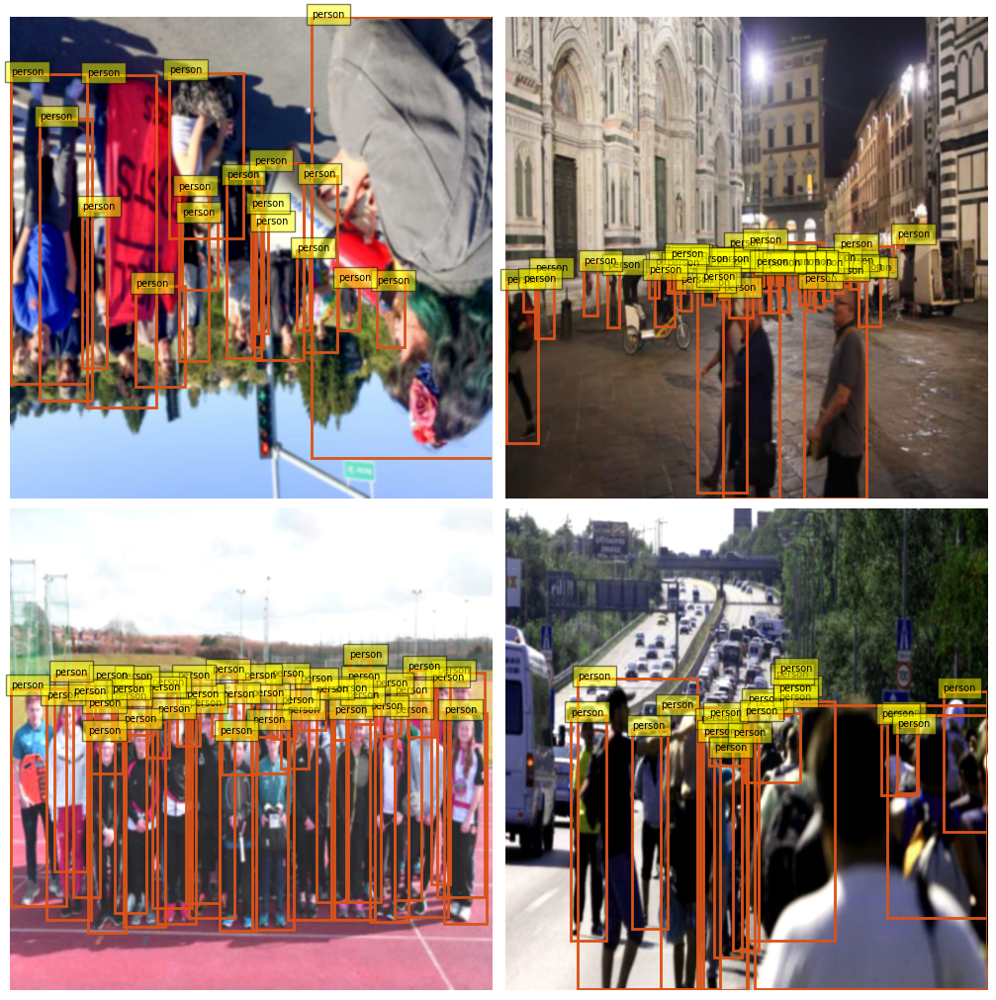

In [5]:
import matplotlib.pyplot as plt
from utils.visualizers import DETRBoxVisualizer

# Create a visualizer
visualizer = DETRBoxVisualizer(class_labels= CLASSES,
                               empty_class_id=0)

# Visualize batches
dataloader_iter = iter(train_loader)
for i in range(1):
    input_, (classes, boxes, masks, _) = next(dataloader_iter)
    fig = plt.figure(figsize=(10, 10), constrained_layout=True)

    for ix in range(4):
        t_cl = classes[ix]
        t_bbox = boxes[ix]
        mask = masks[ix].bool()

        # Filter padded classes/boxes using the binary mask...
        t_cl = t_cl[mask]
        t_bbox = t_bbox[mask] * IMAGE_SIZE

        # Convert to x1y1x2y2 for visualization and denormalize boxes..
        t_bbox = ops.box_convert(
            t_bbox, in_fmt='cxcywh', out_fmt='xyxy')
        
        im = input_[ix]

        ax = fig.add_subplot(2, 2, ix+1)
        visualizer._visualize_image(im, t_bbox, t_cl, ax=ax)

## Building the DETR model

**Note**: If you decide to start from pre-trained weights the `n_classes` argument should
match the number of classes the pre-trained model was trained on (e.g. if trained on "COCO" then it should be 92 classes).

In [6]:
# We do instantiate the model with the COCO dataset parameters in order to load pre-trained weights
# to fine-tune on a new dataset with...
detr_model = DETR(
    d_model=256, n_classes=2, n_tokens=225, 
    n_layers=6, n_heads=8, n_queries=MAX_OBJECTS, use_frozen_bn=True
)

# Or the ConditionalDETR model...
# detr_model = ConditionalDETR(
#     d_model=256, n_classes=92, n_tokens=225, 
#     n_layers=6, n_heads=8, n_queries=MAX_OBJECTS, use_frozen_bn=True
# )

Using cache found in C:\Users\mrinmoy/.cache\torch\hub\pytorch_vision_v0.10.0
c:\Users\mrinmoy\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\mrinmoy\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
c:\Users\mrinmoy\anaconda3\Lib\site-packages\torch\nn\modules\transformer.py:382: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


## Load pre-trained weights as a starting point to explore Transfer Learning (optional)

Using pre-trained weights can significantly speed up training as the model doesn't start from 0.

Training DETR from scratch might take significant time even with enough GPU horsepower, while with
fine-tuning you can get somewhat decent results with 100-150 epochs depending on your dataset size.

In [7]:
# CHECKPOINT_PATH = "<YOUR_DETR_WEIGHTS.pt>"

# # Load the checkpoint
# checkpoint = torch.load(CHECKPOINT_PATH, map_location=torch.device("cpu"))

# # Load the weights into the model
# # We don't use strict matching as you might want to use FrozenBatchNorm2D...
# # Some pre-trained weights come from trainings using BatchNorm2D
# print(detr_model.load_state_dict(checkpoint['state'], strict=False))

# # Adapt the class prediction head to our new dataset
# detr_model.linear_class = nn.Linear(detr_model.linear_class.in_features, len(CLASSES))

## Start the training

In [ ]:
from models.trainer import DETRTrainer

# Create a trainer for DETR
trainer = DETRTrainer(model = detr_model,
                      train_loader= train_loader,
                      val_loader=val_loader,
                      device=device,
                      epochs=EPOCHS,
                      batch_size=BATCH_SIZE,
                      log_freq=LOG_FREQUENCY,
                      save_freq=SAVE_FREQUENCY,
                      freeze_backbone= FREEZE_BACKBONE,
                      num_queries=MAX_OBJECTS,
                      empty_class_id=EMPTY_CLASS_ID)

# Start the training
trainer.train()

Freezing CNN backbone...
CNN backbone is trainable: False
DETR trainable parameters: 11.7M
Starting training for 150 epochs... Using device : cpu


Epoch 1/150:   2%|▎         | 12/480 [02:02<1:19:26, 10.18s/it]


## Plot the training metrics and save the plots

In [ ]:
trainer.visualize_losses(save_dir = "./")

## Load fine-tuned model and test inference

Running inference on device: cpu


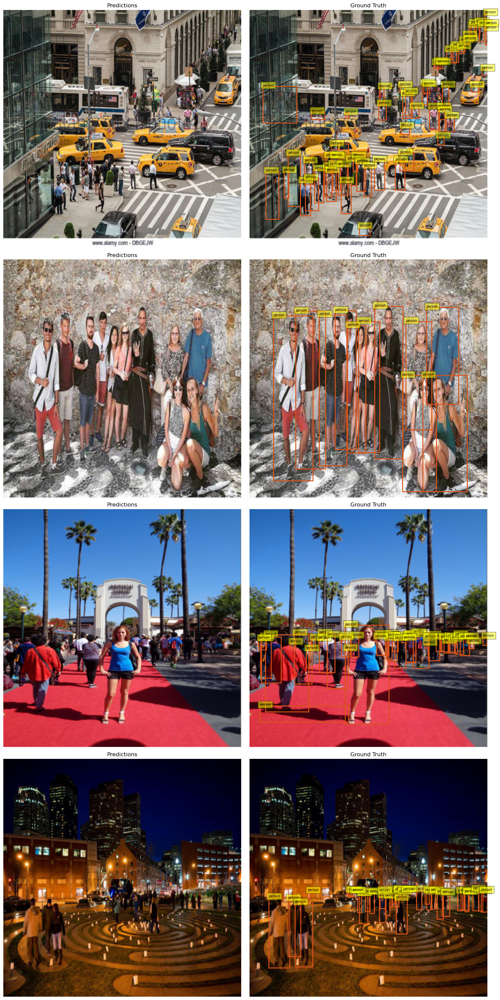

Running inference on device: cpu


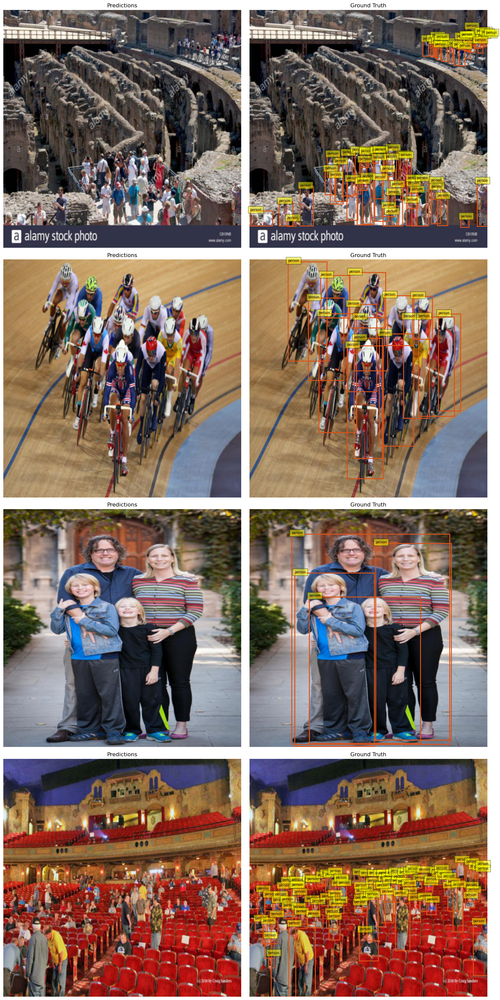

In [ ]:
from utils.visualizers import DETRBoxVisualizer

# WEIGHS_PATH = "<YOUR_WEIGHTS.pt>"
# INFERENCE_DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# # Load the DETR model trained on your custom dataset
# # detr_model = DETR(
# #     d_model=256, n_classes=len(CLASSES), n_tokens=225, 
# #     n_layers=6, n_heads=8, n_queries=MAX_OBJECTS, use_frozen_bn=True
# # ).to(INFERENCE_DEVICE)

# # Or load the Conditional DETR...
# detr_model = ConditionalDETR(
#     d_model=256, n_classes=len(CLASSES), n_tokens=225, 
#     n_layers=6, n_heads=8, n_queries=MAX_OBJECTS, use_frozen_bn=False
# ).to(INFERENCE_DEVICE)

# # Load the checkpoint
# print(detr_model.load_state_dict(torch.load(WEIGHS_PATH, map_location=torch.device(INFERENCE_DEVICE)), strict=False))

# Run inference and check results
visualizer = DETRBoxVisualizer(class_labels= CLASSES,
                               empty_class_id=EMPTY_CLASS_ID)

# This will always run inference on a GPU if one is available...
for i in range(2):
    visualizer.visualize_validation_inference(detr_model, coco_ds_val, collate_fn=collate_fn, batch_size=4)

## Or run inference on a video

In [ ]:
visualizer.visualize_video_inference(
    model=detr_model,
    video_path="<YOUR_VIDEO_PATH>",
    save_dir= "./",
    image_size=480,
    batch_size=4,
    nms_threshold=0.5
)

## Evaluate the trained model using the COCO API

In [ ]:
from models.evaluator import DETREvaluator

evaluator = DETREvaluator(detr_model, coco_ds_val, device, EMPTY_CLASS_ID, collate_fn, batch_size=4)
stats = evaluator.evaluate()